<a href="https://colab.research.google.com/github/albertofernandezvillan/SauvolaNet-torch/blob/main/SauvolaNetDemo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SauvolaNet: Learning Adaptive Sauvola Network

This is a simple demonstrative notebook for the pretrained SauvolaNet

# 1. Download the SauvolaNet Repo

In [ ]:
!pip install tensorflow-gpu==2.3
!pip install parse

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 320.4 MB 53 kB/s 
     |████████████████████████████████| 2.9 MB 14.2 MB/s 
     |████████████████████████████████| 459 kB 55.1 MB/s 
     |████████████████████████████████| 20.1 MB 1.2 MB/s 
     |████████████████████████████████| 26.1 MB 1.2 MB/s 
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0
  Attempting uninstall: scipy
    Found existing installation: scipy 1.7.3
    Uninstalling scipy-1.7.3:
      Successfully uninstalled scipy-1.7.3
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
  

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for parse: filename=parse-1.19.0-py3-none-any.whl size=24591 sha256=4c2e17593c76860f723a3c820221888d3337a037ba434ac1361ce504e8798cec
  Stored in directory: /root/.cache/pip/wheels/9c/aa/cc/f2228050ccb40f22144b073f15a2c84f11204f29fc0dce028e
Successfully built parse


In [ ]:
!rm -rf SauvolaNet
!git clone https://github.com/Leedeng/SauvolaNet.git

Cloning into 'SauvolaNet'...
remote: Enumerating objects: 601, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 601 (delta 12), reused 0 (delta 0), pack-reused 580
Receiving objects: 100% (601/601), 288.29 MiB | 17.55 MiB/s, done.
Resolving deltas: 100% (74/74), done.
Checking out files: 100% (427/427), done.


# 2. Import Dependent Libs and Set Paths

In [ ]:
import cv2
import os
import numpy as np 
import tensorflow as tf
print(tf.__version__)
from matplotlib import pyplot
import sys
sys.path.append('SauvolaNet/SauvolaDocBin/')
import pandas as pd
pd.set_option('display.float_format','{:.4f}'.format)
from dataUtils import collect_binarization_by_dataset, DataGenerator
from testUtils import prepare_inference, find_best_model
from layerUtils import *
from metrics import *
from modelUtils import *

2.3.0


#3. Load A Pretrained SauvolaNet Model

In [ ]:
model_root = 'SauvolaNet/pretrained_models/'
for this in os.listdir(model_root) :
    if this.endswith('.h5') :
        model_filepath = os.path.join(model_root, this)
        model = prepare_inference(model_filepath)
model.summary()

Model: "Sauvola_v3_att_w7.15.23.31.39.47.55.63_k1_R1_a1_inorm"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img01_inp (InputLayer)          [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, None, None, 8 80          img01_inp[0][0]                  
__________________________________________________________________________________________________
inorm0 (InstanceNormalization)  (None, None, None, 8 0           conv0[0][0]                      
__________________________________________________________________________________________________
relu0 (Activation)              (None, None, None, 8 0           inorm0[0][0]                     
______________________________________________

#4. Play With The DIBCO Data

['SauvolaNet/Dataset/DIBCO2009_H03_source.png', 'SauvolaNet/Dataset/MSI2015_H18_source.png', 'SauvolaNet/Dataset/DIBCO2012_H14_target.png', 'SauvolaNet/Dataset/DIBCO2013_P07_source.png', 'SauvolaNet/Dataset/DIBCO2011_P06_source.png', 'SauvolaNet/Dataset/DIBCO2013_H03_target.png', 'SauvolaNet/Dataset/DIBCO2011_P08_target.png', 'SauvolaNet/Dataset/DIBCO2012_H06_target.png', 'SauvolaNet/Dataset/Bickely2010_H07_source.png', 'SauvolaNet/Dataset/DIBCO2016_H04_source.png', 'SauvolaNet/Dataset/MSI2015_H27_source.png', 'SauvolaNet/Dataset/MSI2015_H18_target.png', 'SauvolaNet/Dataset/DIBCO2011_P06_target.png', 'SauvolaNet/Dataset/Nabuco_H13_target.png', 'SauvolaNet/Dataset/MCSset2019_H04_source.png', 'SauvolaNet/Dataset/DIBCO2016_H10_target.png', 'SauvolaNet/Dataset/DIBCO2017_H08_source.png', 'SauvolaNet/Dataset/MCSset2019_H03_source.png', 'SauvolaNet/Dataset/Nabuco_H15_target.png', 'SauvolaNet/Dataset/DIBCO2014_H07_source.png', 'SauvolaNet/Dataset/MSI2015_H20_target.png', 'SauvolaNet/Dataset/Pe

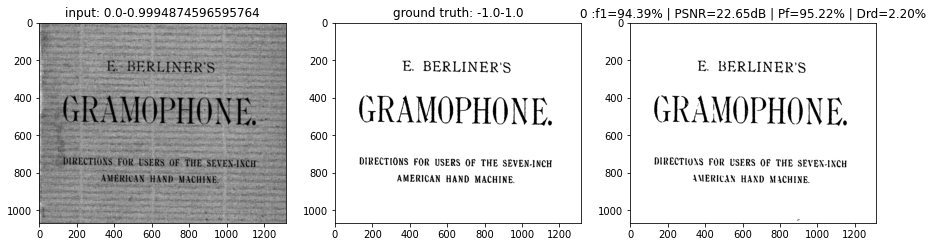

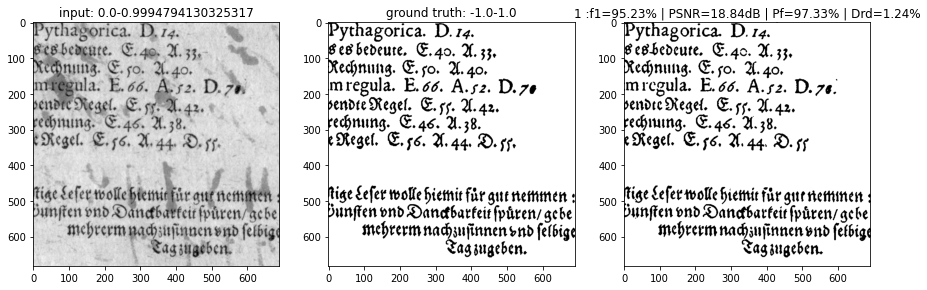

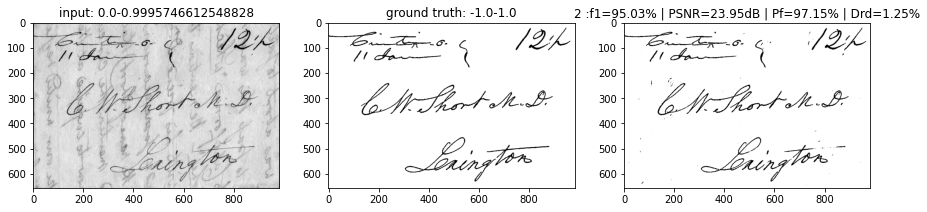

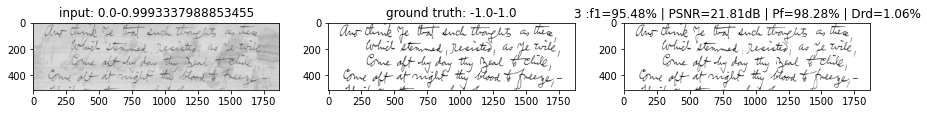

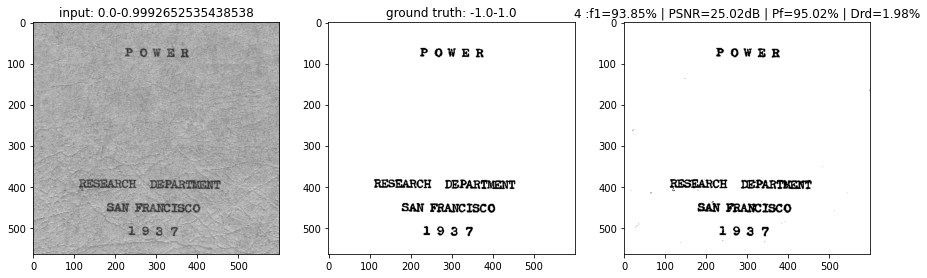

...

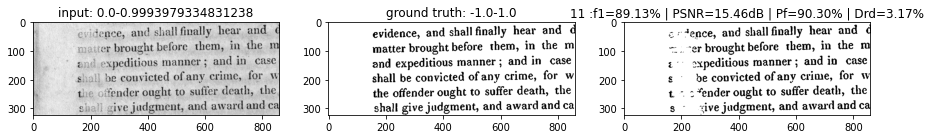

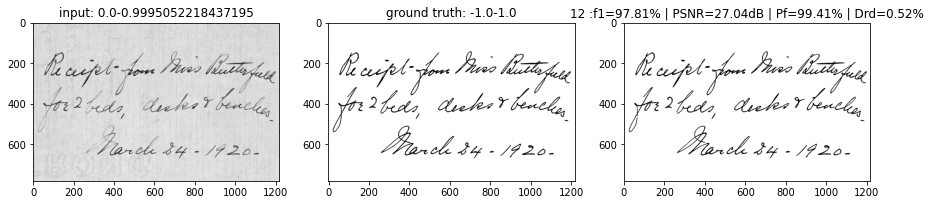

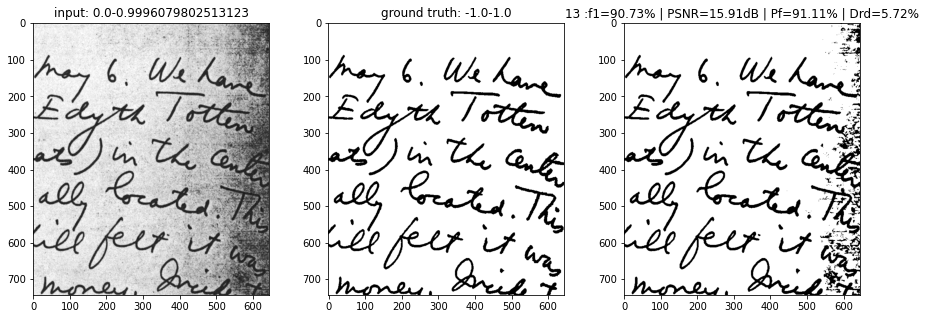

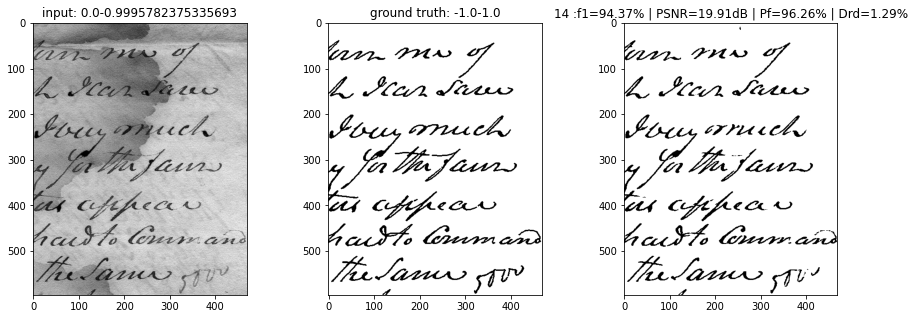

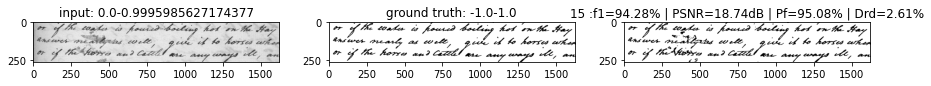

----------------------------------------------------------------------------------------------------
Total average of: DIBCO2011 [ 0.94324327 20.55584669  0.96401908  1.96574723]


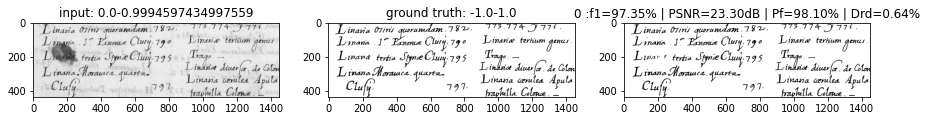

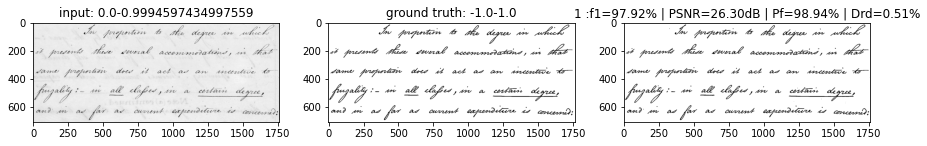

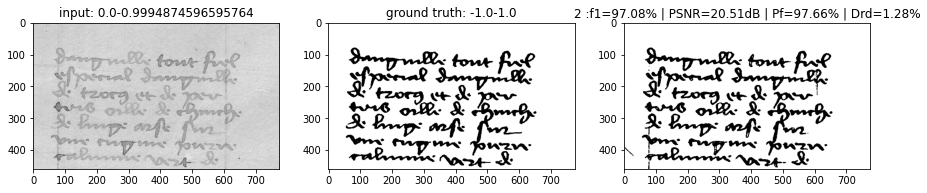

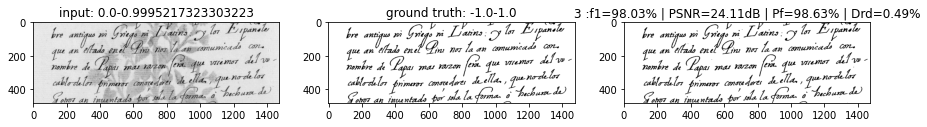

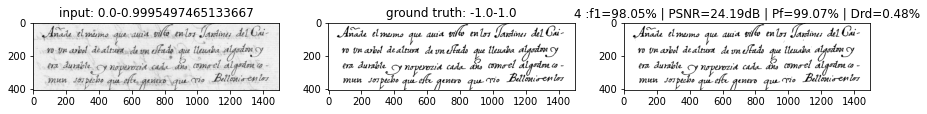

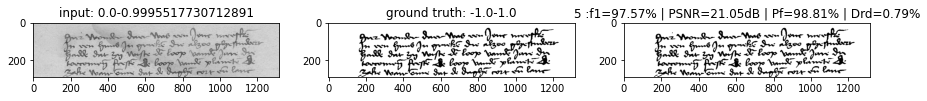

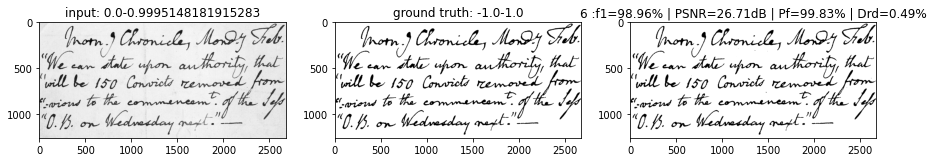

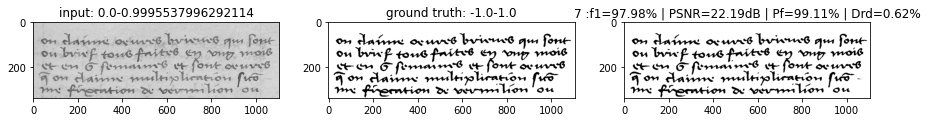

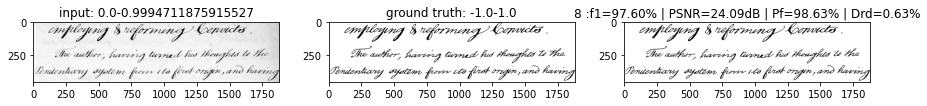

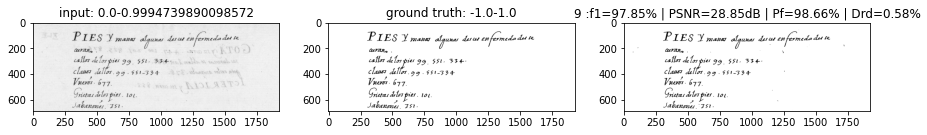

----------------------------------------------------------------------------------------------------
Total average of: DIBCO2014 [ 0.97839581 24.13198494  0.98744013  0.65013766]


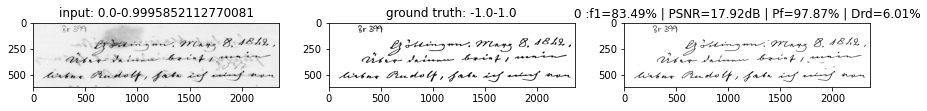

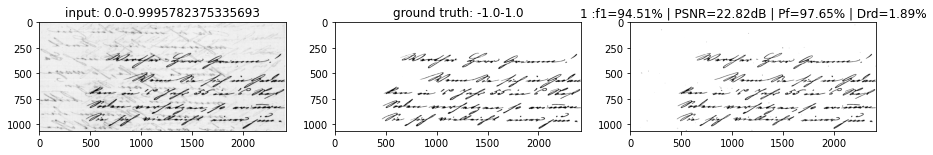

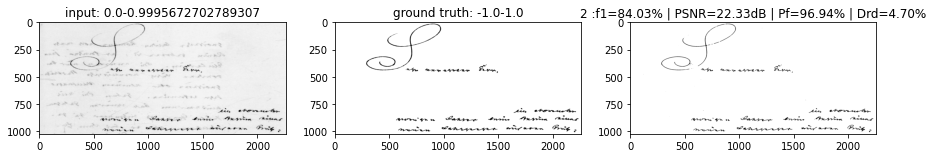

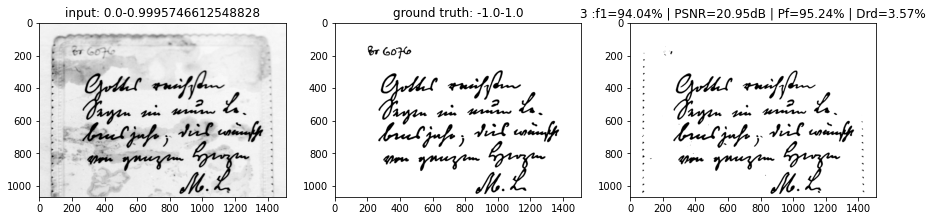

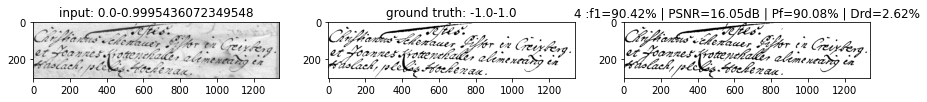

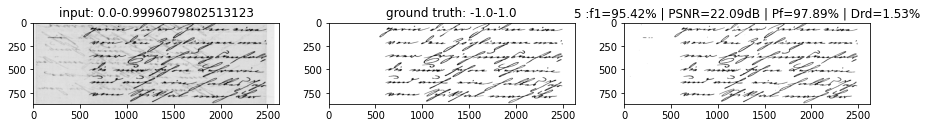

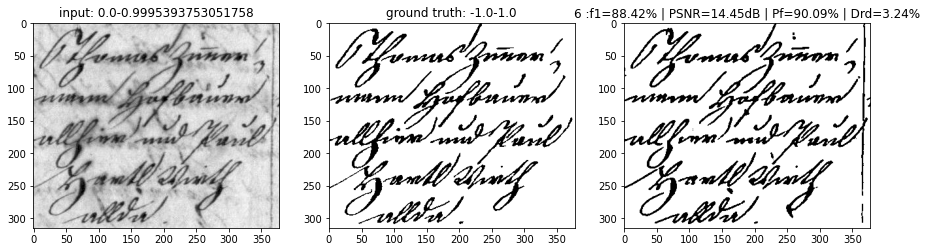

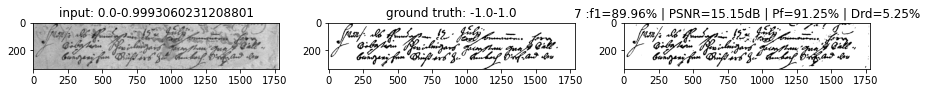

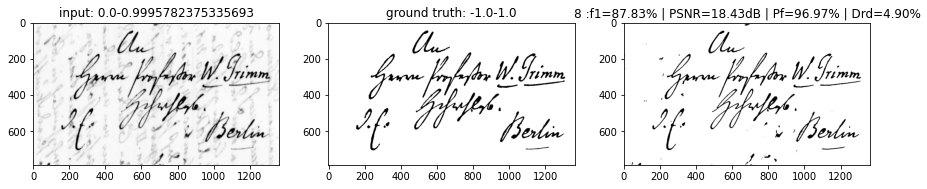

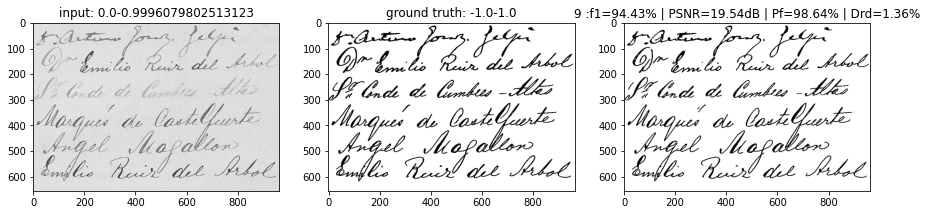

----------------------------------------------------------------------------------------------------
Total average of: DIBCO2016 [ 0.90256423 18.97231545  0.95262459  3.50618298]


In [ ]:
dataset_lut = collect_binarization_by_dataset('SauvolaNet/Dataset')
test_datasets = ["DIBCO2011","DIBCO2014","DIBCO2016"]
for this in test_datasets :
    all_metrics = []
    test_datagen = DataGenerator(dataset_lut[this], output_shape=None, mode='testing')
    L = len(test_datagen)
    for i in range(L) :
        x, y = test_datagen[i]
        z = model.predict(x)
        pyplot.figure(figsize=(15,5))
        pyplot.subplot(131)
        pyplot.imshow(x[0,...,0], cmap='gray')
        pyplot.title('input: {}-{}'.format(x.min(), x.max()))
        pyplot.subplot(132)
        pyplot.imshow(y[0,...,0], cmap='gray', vmin=-1, vmax=1)
        pyplot.title('ground truth: {}-{}'.format(y.min(), y.max()))
        pyplot.subplot(133)
        pyplot.imshow(z[0,...,0]>0, cmap='gray', vmin=0, vmax=1)
        pyplot.title(f'predicted {z.min():.2f} - {z.max():.2f}')
        f1 = Fmeasure(z[0,...,0]>0,y[0,...,0]>0)
        psnr = Psnr(z[0,...,0]>0,y[0,...,0]>0)
        Pf = Pfmeasure(z[0,...,0]>0,y[0,...,0]>0)
        drd = DRD(z[0,...,0]>0,y[0,...,0]>0)
        all_metrics.append([f1, psnr, Pf, drd])
        pyplot.title(f'{i} :f1={f1*100:.2f}% | PSNR={psnr:.2f}dB | Pf={Pf*100:.2f}% | Drd={drd:.2f}%')
        pyplot.show()
    print('-' * 100)
    print("Total average of: " +this+" "+ str(np.mean(all_metrics,axis=0)))

#5. Play with wild data

In [ ]:
from PIL import Image
import requests
def read_image_from_url(url) :
    im = Image.open(requests.get(url, stream=True).raw)
    rgb = np.array(im)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    return gray, rgb

def decode_online_image(url, figsize=(10,5)) :
    gray, rgb = read_image_from_url(url)
    pyplot.figure(figsize=figsize)
    pyplot.subplot(121)
    pyplot.imshow(rgb,)
    pyplot.title('original RGB input')
    pyplot.subplot(122)
    x = gray.astype('float32')[None, ..., None]/255.
    pred = model.predict(x)
    pyplot.imshow(pred[0,...,0] > 0, cmap='gray')
    pyplot.title('predicted binary output')
    pyplot.show()

def read_image(path, max_width=1200) :
    im = Image.open(path)
    rgb = np.array(im)
    if rgb.shape[1] > max_width:
      rgb = cv2.resize(rgb, (max_width, int(rgb.shape[0] *  (max_width/rgb.shape[1]))))
      print("resize to ", rgb.shape)
    gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
    return gray, rgb

def decode_image(path, figsize=(10,5), max_width=1200) :
    gray, rgb = read_image(path, max_width=max_width)
    pyplot.figure(figsize=figsize)
    pyplot.subplot(121)
    pyplot.imshow(rgb,)
    pyplot.title('original RGB input')
    pyplot.subplot(122)
    x = gray.astype('float32')[None, ..., None]/255.
    pred = model.predict(x)
    pyplot.imshow(pred[0,...,0] > 0, cmap='gray')
    pyplot.title('predicted binary output')
    pyplot.show()

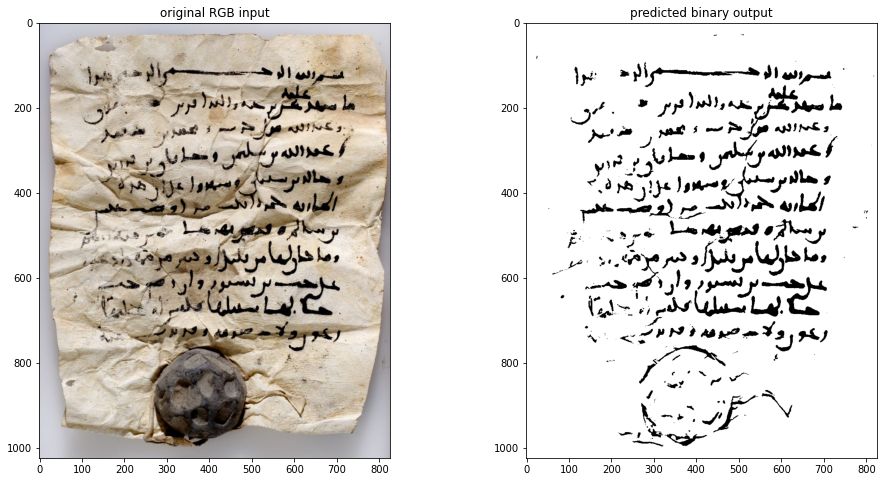

In [ ]:
decode_online_image('https://www.khalilicollections.org/wp-content/uploads/2007/01/doc-0046-825x1024.jpg', figsize=(16,8))
#'https://lostrussianfamily.files.wordpress.com/2015/06/ancietcopy.jpg'

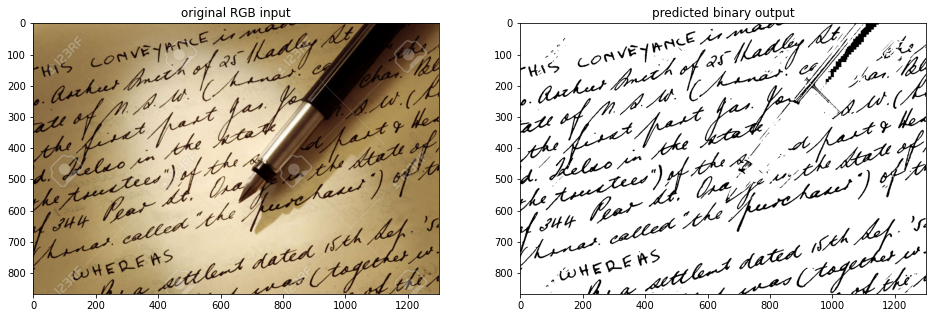

In [ ]:
decode_online_image('https://previews.123rf.com/images/robynmac/robynmac1001/robynmac100100062/6291229-old-handwritten-legal-document-with-fountain-pen-real-estate-conveyancing-settlement-from-the-1950-s.jpg', figsize=(16,8))

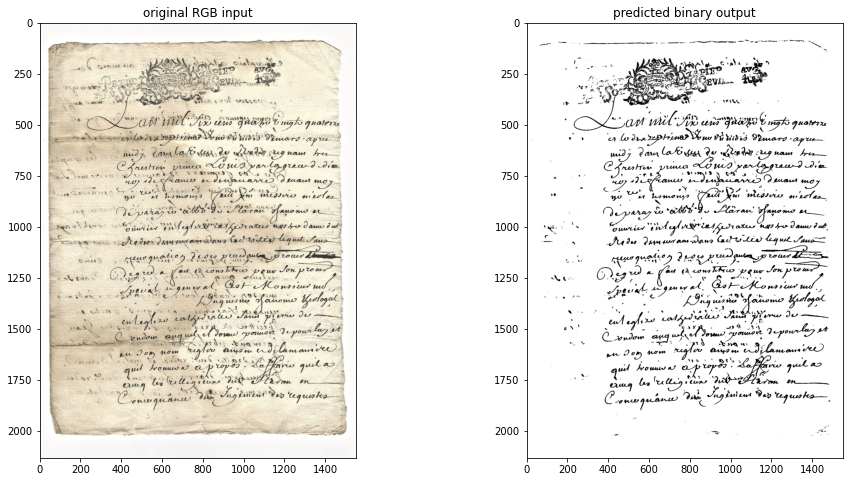

In [ ]:
decode_online_image('https://i.pinimg.com/originals/cb/61/68/cb6168d212ce635c2a7708a95f7f6279.jpg', figsize=(16,8))

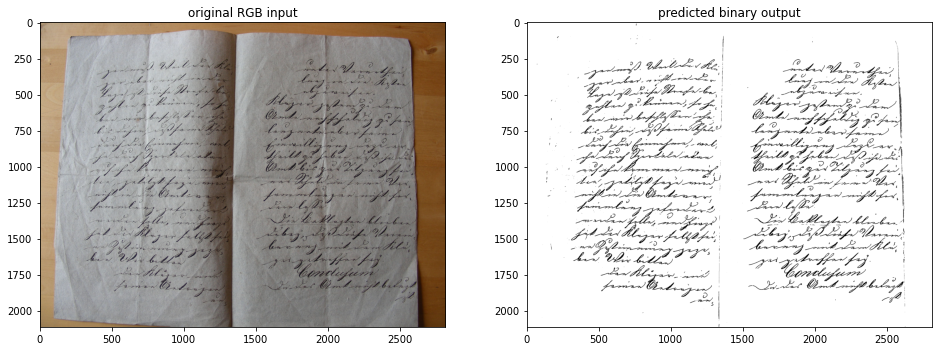

In [ ]:
decode_online_image('https://i.etsystatic.com/10137874/r/il/e90a2a/1525079766/il_fullxfull.1525079766_ha36.jpg', figsize=(16,8))

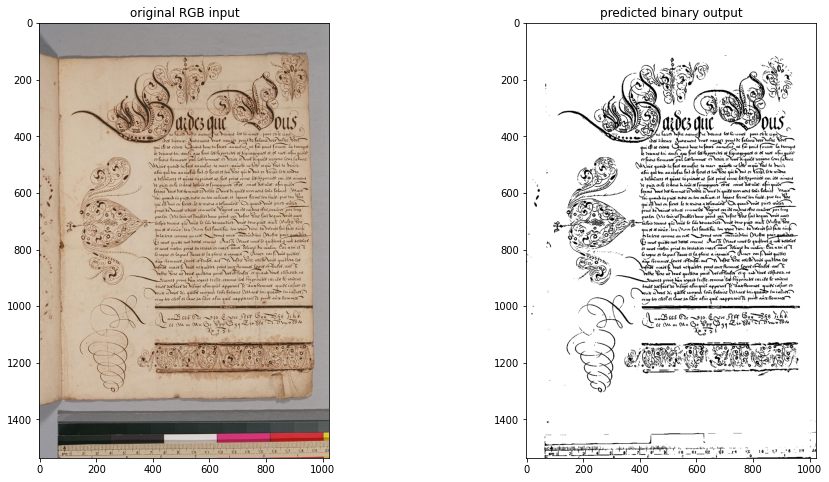

In [ ]:
decode_online_image('https://i.pinimg.com/originals/bd/f6/e3/bdf6e394951d39b84c14503f4dfb1db4.jpg', figsize=(16,8))

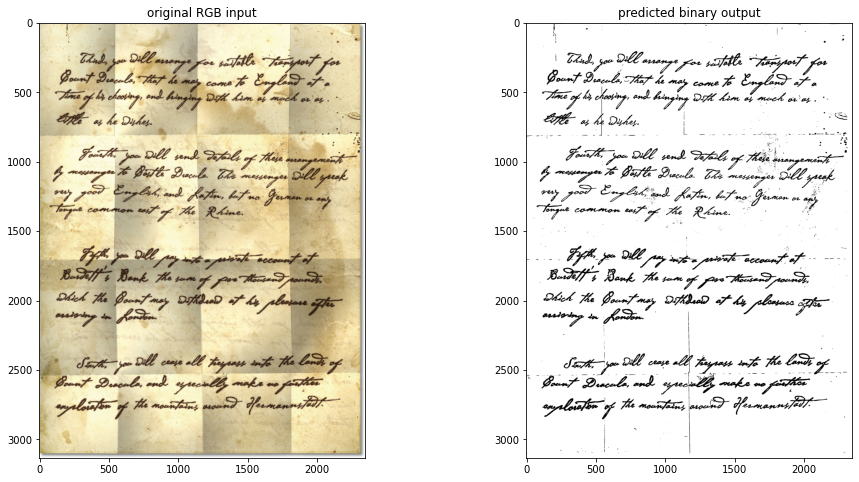

In [ ]:
decode_online_image('https://cthulhureborn.files.wordpress.com/2015/05/hawkins-papers-letter-from-dracula-page-2-texture.jpg', figsize=(16,8))

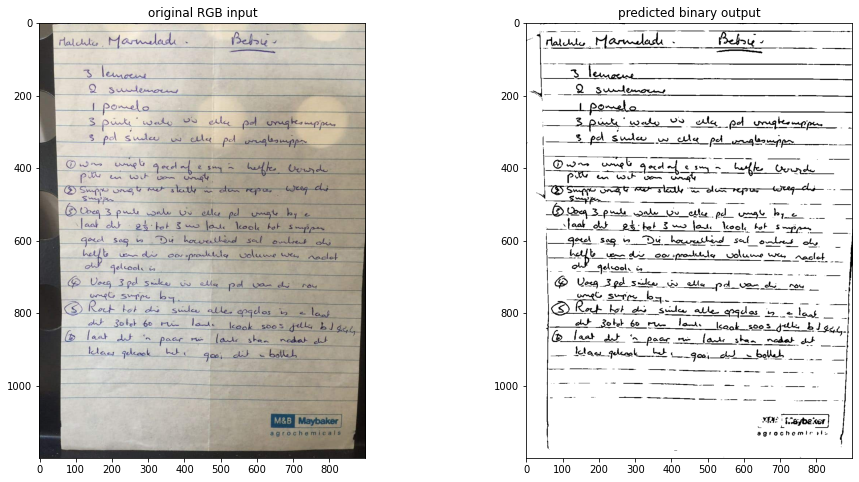

In [ ]:
decode_online_image('https://cdn2.f-cdn.com/contestentries/1487141/1872885/5cab7b1a2c096_thumb900.jpg', figsize=(16,8))

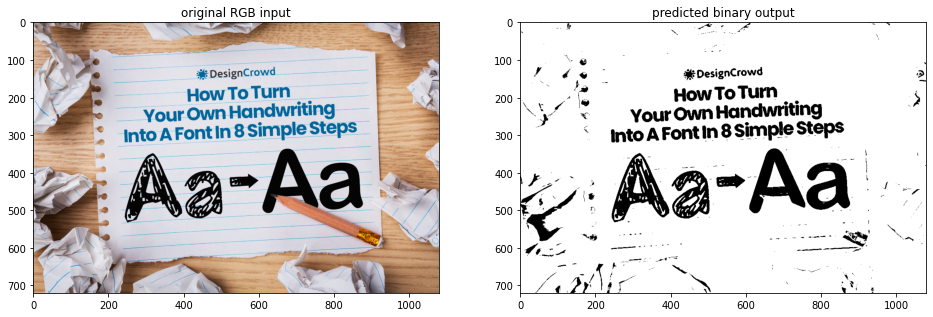

In [ ]:
decode_online_image('https://s3.amazonaws.com/cdn.designcrowd.com/blog/How-To-Turn-Your-Own-Handwriting-Into-A-Font-In-8-Simple-Steps-2/header-how-to-turn-your-own-handwriting-into-a-font-in-8-simple-steps-designcrowd-blog.png', figsize=(16,8))

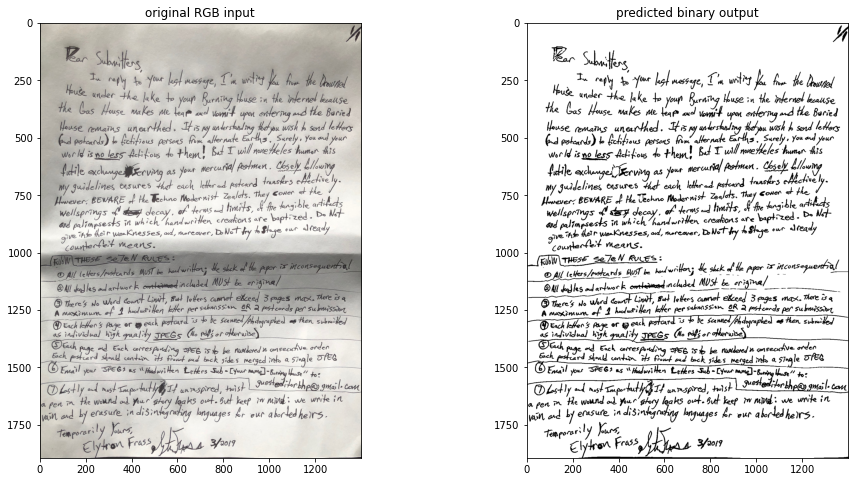

In [ ]:
decode_online_image('https://burninghousepressblog.files.wordpress.com/2019/02/3-2019-guest-editors-guidelines-elytron-frass-bhp.jpg?w=1400', figsize=(16,8))

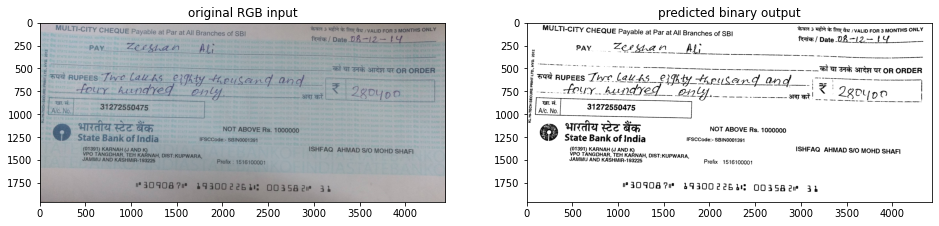

In [ ]:
decode_online_image('https://i.stack.imgur.com/yN2Do.jpg', figsize=(16,8))

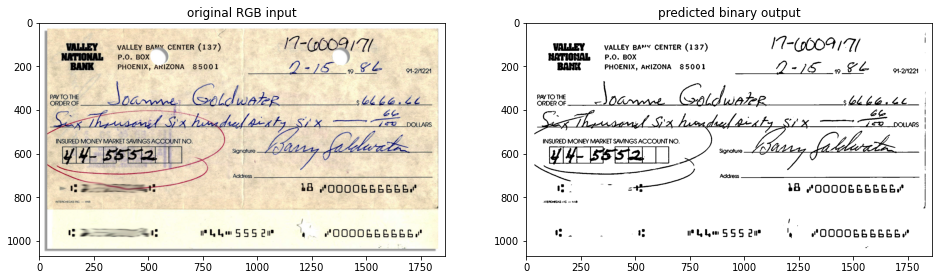

In [ ]:
decode_online_image('https://natedsanders.com/ItemImages/000004/37564_lg.jpeg', figsize=(16,8))

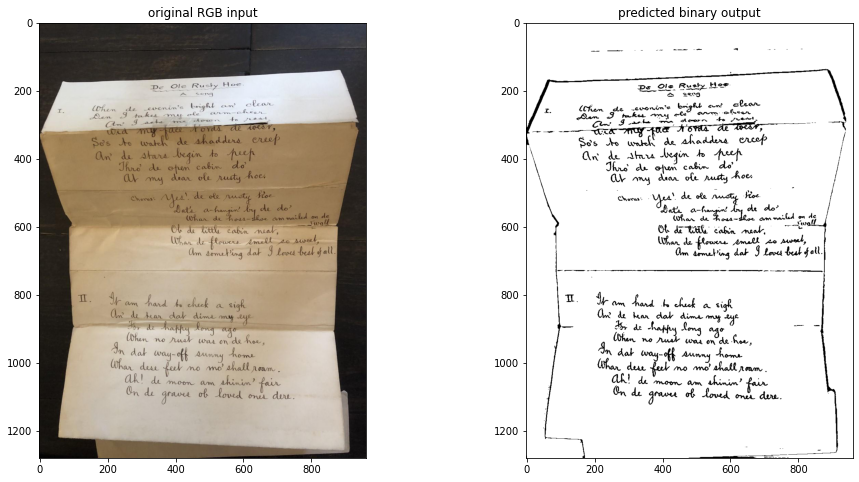

In [ ]:
decode_online_image('https://pictures.abebooks.com/inventory/30432386209.jpg', figsize=(16,8))

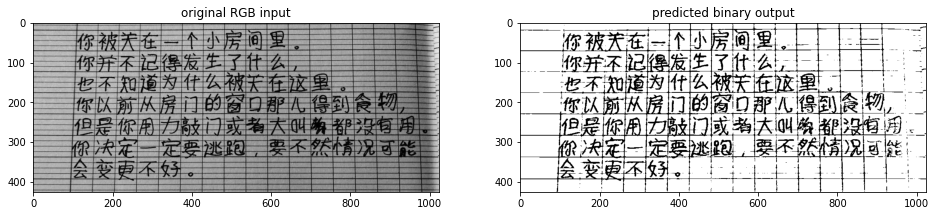

In [ ]:
decode_online_image('https://www.hackingchinese.com/wp-content/uploads/2018/11/2y-1024x426.jpg', figsize=(16,8))

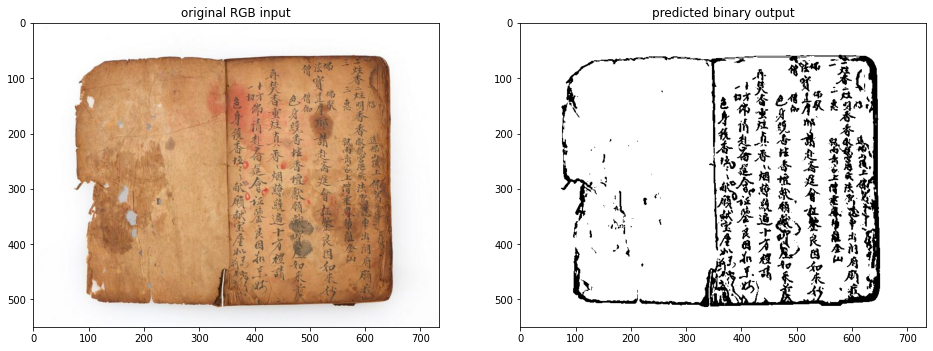

In [ ]:
decode_online_image('https://static2.lot-art.com/public/upl/83/Antique-Chinese-Handwritten-Book-on-Handmade-Paper_1596583639_7316.jpg', figsize=(16,8))

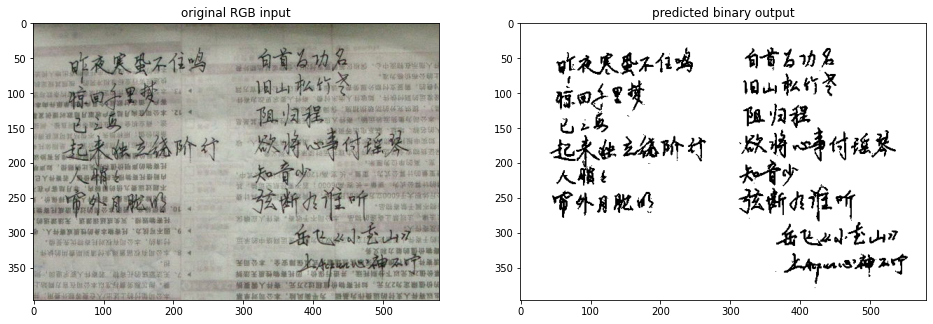

In [ ]:
decode_online_image('https://i.stack.imgur.com/CasGN.jpg', figsize=(16,8))

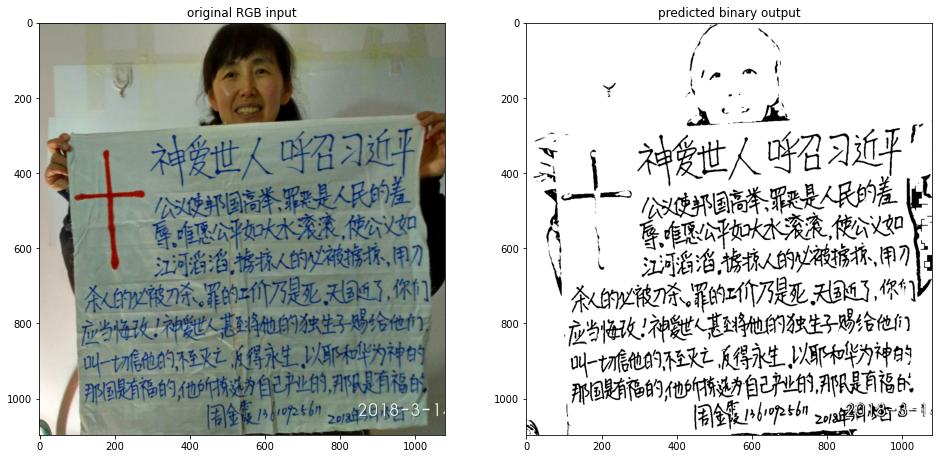

In [ ]:
decode_online_image('https://3.bp.blogspot.com/-Ek0fD0M8-WI/WrLgyoRFNOI/AAAAAAAADAc/471I8Q1jO0oCg4-uygh-dGXjo-iMyiQhwCLcBGAs/s1600/cm0318-qnp.JPG', figsize=(16,8))

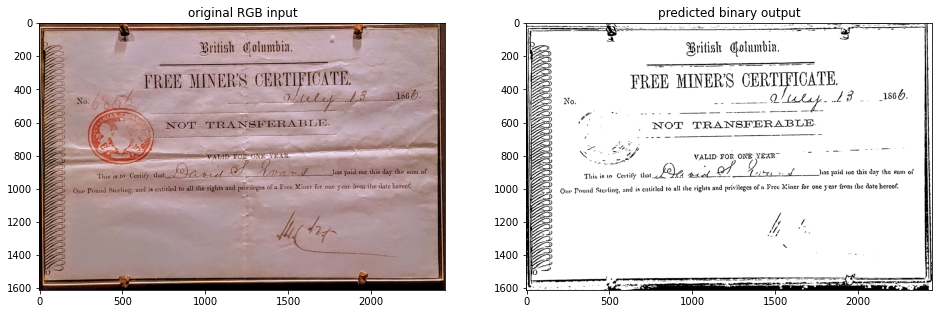

In [ ]:
decode_online_image('https://www.westcoastplacer.com/wp-content/uploads/2020/01/20210326_173632.jpg', figsize=(16,8))

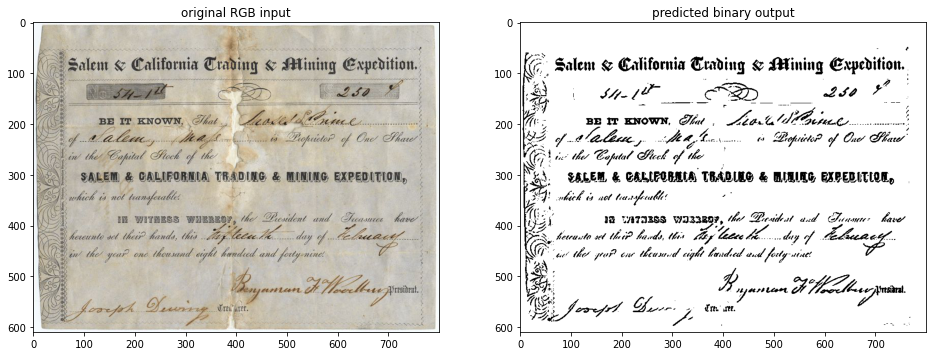

In [ ]:
decode_online_image('https://i.pinimg.com/originals/9e/64/1e/9e641e4b9e46f7782aba5ce4b967d5b0.jpg', figsize=(16,8))

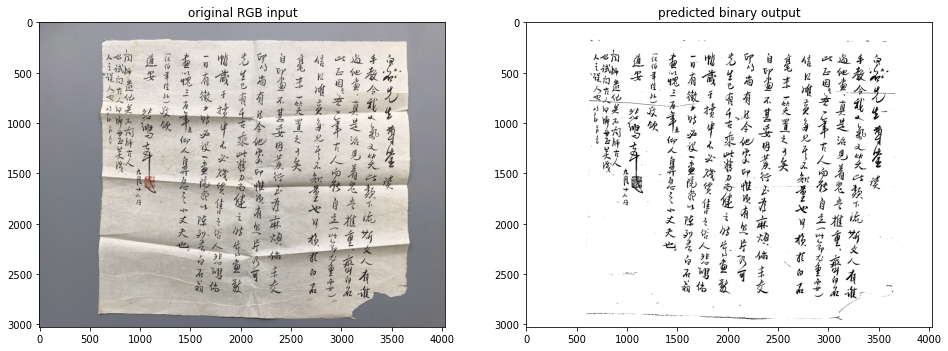

In [ ]:
decode_online_image('https://image.invaluable.com/housePhotos/Portland/32/633432/H20069-L154991303_original.jpg', figsize=(16,8))

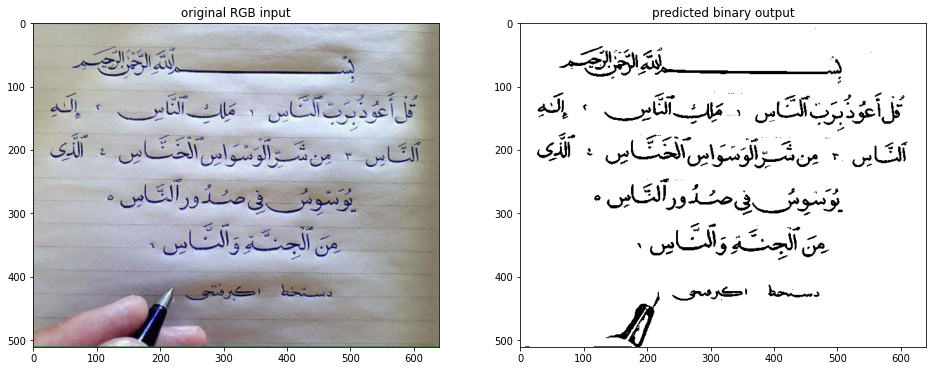

In [ ]:
decode_online_image('https://i.redd.it/r5wqmyhlil441.jpg', figsize=(16,8))

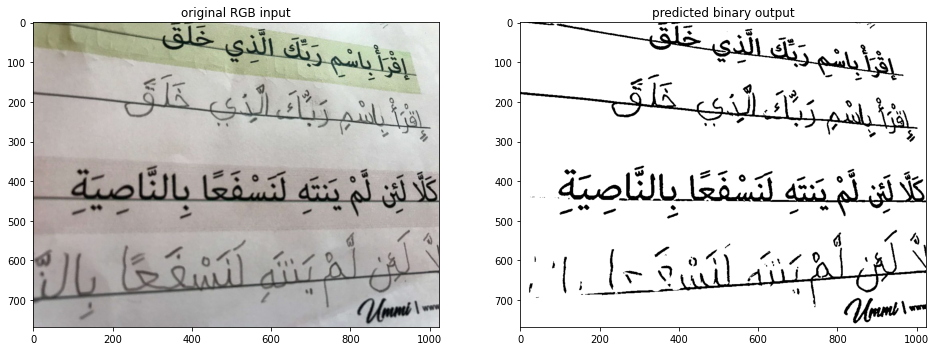

In [ ]:
decode_online_image('https://ummi.org/wp-content/uploads/2019/10/IMG-7453-1024x768.jpeg', figsize=(16,8))

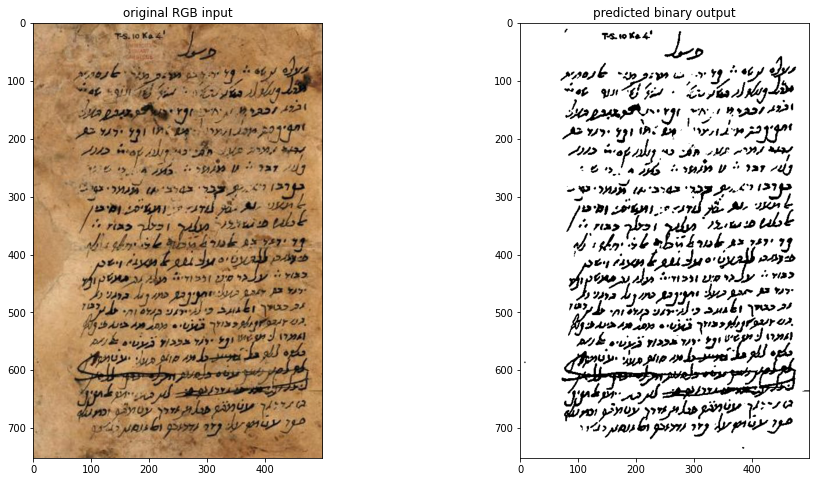

In [ ]:
decode_online_image('https://w2.chabad.org/media/images/994/OOKh9942352.jpg', figsize=(16,8))

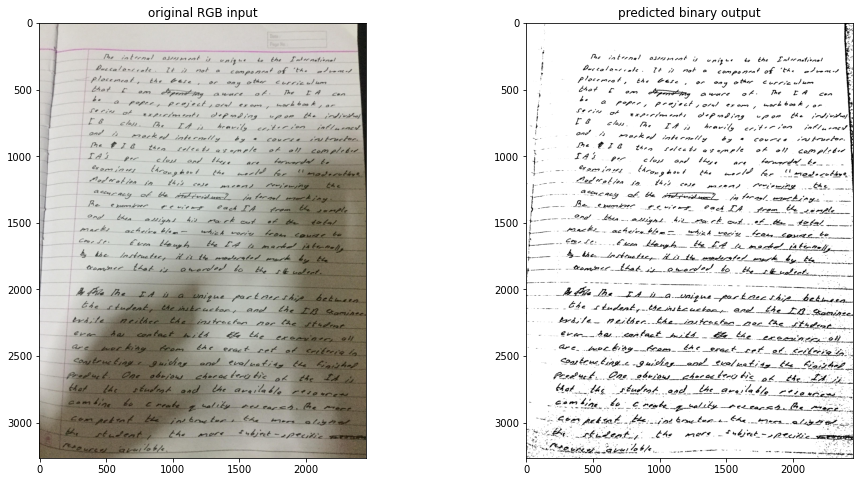

In [ ]:
decode_online_image('https://i.redd.it/wy770qtsrb911.jpg', figsize=(16,8))

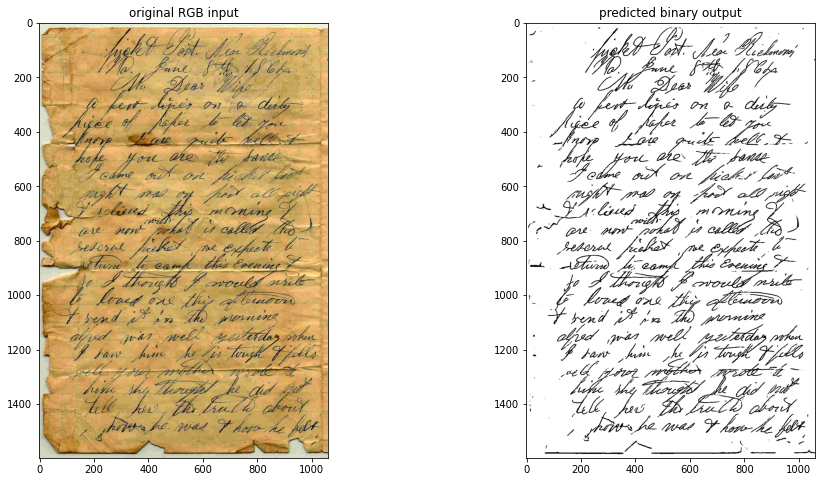

In [ ]:
decode_online_image('https://i.pinimg.com/originals/3e/f0/3f/3ef03f73fc43c05ee56205f21b4366a5.jpg', figsize=(16,8))

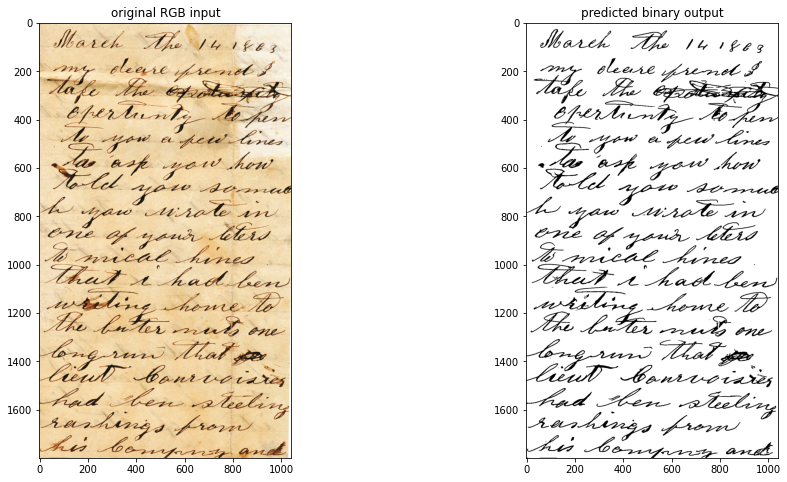

In [ ]:
decode_online_image('https://microship.com/wp-content/uploads/2016/05/soldier-letter-1.jpg', figsize=(16,8))

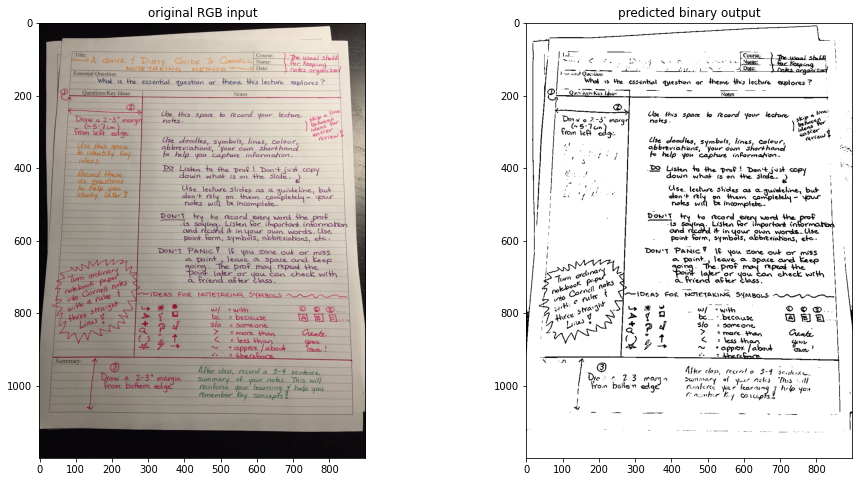

In [ ]:
decode_online_image('https://pbs.twimg.com/media/DLFrkyXWsAA6wrc.jpg', figsize=(16,8))

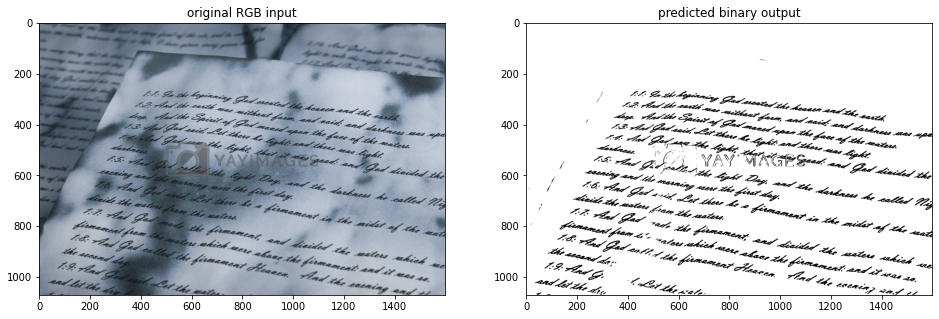

In [ ]:
decode_online_image('https://thumbnails.yayimages.com/1600/0/21f/21f727.jpg', figsize=(16,8))